In [1]:
#!pip install spacy

In [2]:
#!pip install nltk

In [3]:
#!python -m spacy download en_core_web_md

In [4]:
#!pip install wordcloud

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import spacy
from matplotlib.pyplot import imread
from wordcloud import WordCloud,STOPWORDS
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

[nltk_data] Downloading package punkt to C:\Users\Dayakar Reddy
[nltk_data]     Sura\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [6]:
data=pd.read_csv("C:/Users/Dayakar Reddy Sura/Downloads/blogs.csv")
data.head()

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism


In [7]:
data1=data.copy()

In [8]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Data    2000 non-null   object
 1   Labels  2000 non-null   object
dtypes: object(2)
memory usage: 31.4+ KB


In [9]:
data1.shape

(2000, 2)

In [10]:
data1.Labels.value_counts()

alt.atheism                 100
comp.graphics               100
talk.politics.misc          100
talk.politics.mideast       100
talk.politics.guns          100
soc.religion.christian      100
sci.space                   100
sci.med                     100
sci.electronics             100
sci.crypt                   100
rec.sport.hockey            100
rec.sport.baseball          100
rec.motorcycles             100
rec.autos                   100
misc.forsale                100
comp.windows.x              100
comp.sys.mac.hardware       100
comp.sys.ibm.pc.hardware    100
comp.os.ms-windows.misc     100
talk.religion.misc          100
Name: Labels, dtype: int64

In [11]:
#label=LabelEncoder()
#data1['Labels']=label.fit_transform(data1['Labels'])

In [12]:
data1.head()

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism


In [13]:
data1.Labels.value_counts()

alt.atheism                 100
comp.graphics               100
talk.politics.misc          100
talk.politics.mideast       100
talk.politics.guns          100
soc.religion.christian      100
sci.space                   100
sci.med                     100
sci.electronics             100
sci.crypt                   100
rec.sport.hockey            100
rec.sport.baseball          100
rec.motorcycles             100
rec.autos                   100
misc.forsale                100
comp.windows.x              100
comp.sys.mac.hardware       100
comp.sys.ibm.pc.hardware    100
comp.os.ms-windows.misc     100
talk.religion.misc          100
Name: Labels, dtype: int64

In [14]:
data1=[Data.strip() for Data in data1.Data]
data1=[Data for Data in data1 if Data]

In [15]:
data1

['Path: cantaloupe.srv.cs.cmu.edu!magnesium.club.cc.cmu.edu!news.sei.cmu.edu!cis.ohio-state.edu!zaphod.mps.ohio-state.edu!howland.reston.ans.net!agate!doc.ic.ac.uk!uknet!mcsun!Germany.EU.net!thoth.mchp.sni.de!horus.ap.mchp.sni.de!D012S658!frank\nFrom: frank@D012S658.uucp (Frank O\'Dwyer)\nNewsgroups: alt.atheism\nSubject: Re: islamic genocide\nDate: 23 Apr 1993 23:51:47 GMT\nOrganization: Siemens-Nixdorf AG\nLines: 110\nDistribution: world\nMessage-ID: <1r9vej$5k5@horus.ap.mchp.sni.de>\nReferences: <1r4o8a$6qe@fido.asd.sgi.com> <1r5ubl$bd6@horus.ap.mchp.sni.de> <1r76ek$7uo@fido.asd.sgi.com>\nNNTP-Posting-Host: d012s658.ap.mchp.sni.de\n\nIn article <1r76ek$7uo@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#In article <1r5ubl$bd6@horus.ap.mchp.sni.de>, frank@D012S658.uucp (Frank O\'Dwyer) writes:\n#|> In article <1r4o8a$6qe@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#|> #\n#|> #Noting that a particular society, in this case the mainland UK

In [16]:
len(data1)

2000

In [17]:
text=' '.join(data1)
text

'Path: cantaloupe.srv.cs.cmu.edu!magnesium.club.cc.cmu.edu!news.sei.cmu.edu!cis.ohio-state.edu!zaphod.mps.ohio-state.edu!howland.reston.ans.net!agate!doc.ic.ac.uk!uknet!mcsun!Germany.EU.net!thoth.mchp.sni.de!horus.ap.mchp.sni.de!D012S658!frank\nFrom: frank@D012S658.uucp (Frank O\'Dwyer)\nNewsgroups: alt.atheism\nSubject: Re: islamic genocide\nDate: 23 Apr 1993 23:51:47 GMT\nOrganization: Siemens-Nixdorf AG\nLines: 110\nDistribution: world\nMessage-ID: <1r9vej$5k5@horus.ap.mchp.sni.de>\nReferences: <1r4o8a$6qe@fido.asd.sgi.com> <1r5ubl$bd6@horus.ap.mchp.sni.de> <1r76ek$7uo@fido.asd.sgi.com>\nNNTP-Posting-Host: d012s658.ap.mchp.sni.de\n\nIn article <1r76ek$7uo@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#In article <1r5ubl$bd6@horus.ap.mchp.sni.de>, frank@D012S658.uucp (Frank O\'Dwyer) writes:\n#|> In article <1r4o8a$6qe@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#|> #\n#|> #Noting that a particular society, in this case the mainland UK,

In [18]:
no_punc_text=text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Path cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsunGermanyEUnetthothmchpsnidehorusapmchpsnideD012S658frank\nFrom frankD012S658uucp Frank ODwyer\nNewsgroups altatheism\nSubject Re islamic genocide\nDate 23 Apr 1993 235147 GMT\nOrganization SiemensNixdorf AG\nLines 110\nDistribution world\nMessageID 1r9vej5k5horusapmchpsnide\nReferences 1r4o8a6qefidoasdsgicom 1r5ublbd6horusapmchpsnide 1r76ek7uofidoasdsgicom\nNNTPPostingHost d012s658apmchpsnide\n\nIn article 1r76ek7uofidoasdsgicom liveseysolntzewpdsgicom Jon Livesey writes\nIn article 1r5ublbd6horusapmchpsnide frankD012S658uucp Frank ODwyer writes\n In article 1r4o8a6qefidoasdsgicom liveseysolntzewpdsgicom Jon Livesey writes\n \n Noting that a particular society in this case the mainland UK\n has few religously motivated murders and few murders of any\n kind says very little about whether interreligion murders elsewhere\n are religiously motivated\n \

#### Tokenize

In [19]:
text_token=word_tokenize(no_punc_text)
print(len(text_token))

607632


In [20]:
text_token[0:20]

['Path',
 'cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsunGermanyEUnetthothmchpsnidehorusapmchpsnideD012S658frank',
 'From',
 'frankD012S658uucp',
 'Frank',
 'ODwyer',
 'Newsgroups',
 'altatheism',
 'Subject',
 'Re',
 'islamic',
 'genocide',
 'Date',
 '23',
 'Apr',
 '1993',
 '235147',
 'GMT',
 'Organization',
 'SiemensNixdorf']

In [21]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Dayakar Reddy
[nltk_data]     Sura\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [22]:
stop_word=stopwords.words('english')
stop_word
len(stop_word)

179

In [23]:
stop_token=[word for word in text_token if not word.lower() in stop_word]
print(len(stop_token))

369120


In [24]:
lower_word=[Data.lower() for Data in stop_token]
print(lower_word[0:25])

['path', 'cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnided012s658frank', 'frankd012s658uucp', 'frank', 'odwyer', 'newsgroups', 'altatheism', 'subject', 'islamic', 'genocide', 'date', '23', 'apr', '1993', '235147', 'gmt', 'organization', 'siemensnixdorf', 'ag', 'lines', '110', 'distribution', 'world', 'messageid', '1r9vej5k5horusapmchpsnide']


#### Stemming

In [25]:
ps=PorterStemmer()

In [26]:
stemmed_tokens=[ps.stem(word) for word in lower_word]
print(len(set(stemmed_tokens)))

47244


In [27]:
stemmed_tokens[0:25]

['path',
 'cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnided012s658frank',
 'frankd012s658uucp',
 'frank',
 'odwyer',
 'newsgroup',
 'altath',
 'subject',
 'islam',
 'genocid',
 'date',
 '23',
 'apr',
 '1993',
 '235147',
 'gmt',
 'organ',
 'siemensnixdorf',
 'ag',
 'line',
 '110',
 'distribut',
 'world',
 'messageid',
 '1r9vej5k5horusapmchpsnid']

In [28]:
!python -m spacy download en

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB 1.3 MB/s eta 0:00:10
     ---------------------------------------- 0.1/12.8 MB 1.3 MB/s eta 0:00:10
     --- ------------------------------------ 1.2/12.8 MB 11.2 MB/s eta 0:00:02
     ------- -------------------------------- 2.4/12.8 MB 13.9 MB/s eta 0:00:01
     ----------- ---------------------------- 3.7/12.8 MB 17.1 MB/s eta 0:00:01
     --------------- ------------------------ 5.1/12.8 MB 19.1 MB/s eta 0:00:01
     -------------------- ------------------- 6.5/12.8 MB 20.8 MB/s eta 0:00:01
     ------------------------ --------------- 7.8/12.8 MB 21.7 MB/s eta 0:00:01
     ---------------------------- ----------- 9.1/12.8 MB 22.4 MB/s eta 0:00:01
     -------------------------------- ------ 10.5/12.8 MB 27.3 MB/s eta 0:00:01
     ------------------------------------ -- 11.9/12.8 MB 28.5 MB/s eta 0:00:01
     --------------------------------------  12.8/

In [29]:
nlp=spacy.load('en_core_web_sm')

In [30]:
doc=nlp(' '.join(stop_word))
print(doc[0:40])

i me my myself we our ours ourselves you you're you've you'll you'd your yours yourself yourselves he him his himself she she's her hers herself it it's its itself they them their theirs


In [31]:
lemmas=[token.lemma_ for token in doc]
print(len(set(lemmas)))

145


In [32]:
lemmas[0:25]

['I',
 'I',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 'you',
 'be',
 'you',
 'have',
 'you',
 'will',
 'you',
 'would',
 'your',
 'yours',
 'yourself',
 'yourselve',
 'he',
 'he',
 'his',
 'himself']

#### Feature Extraction

In [33]:
from sklearn.feature_extraction.text import CountVectorizer

In [34]:
vectorizer=CountVectorizer()
f_x=vectorizer.fit_transform(stemmed_tokens)

In [35]:
vectorizer.vocabulary_

{'path': 34527,
 'cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnided012s658frank': 15722,
 'frankd012s658uucp': 22969,
 'frank': 22966,
 'odwyer': 33606,
 'newsgroup': 32661,
 'altath': 10283,
 'subject': 41530,
 'islam': 26567,
 'genocid': 23522,
 'date': 19358,
 '23': 6184,
 'apr': 11075,
 '1993': 3474,
 '235147': 6304,
 'gmt': 23786,
 'organ': 33924,
 'siemensnixdorf': 39820,
 'ag': 9897,
 'line': 28742,
 '110': 1164,
 'distribut': 20315,
 'world': 46306,
 'messageid': 30501,
 '1r9vej5k5horusapmchpsnid': 5462,
 'refer': 37283,
 '1r4o8a6qefidoasdsgicom': 5371,
 '1r5ublbd6horusapmchpsnid': 5386,
 '1r76ek7uofidoasdsgicom': 5412,
 'nntppostinghost': 33045,
 'd012s658apmchpsnid': 19164,
 'articl': 11395,
 'liveseysolntzewpdsgicom': 28848,
 'jon': 27150,
 'livesey': 28847,
 'write': 46376,
 'note': 33285,
 'particular': 34462,
 'societi': 40488,
 'case': 16526,
 '

In [36]:
pd.DataFrame(vectorizer.vocabulary_,columns=vectorizer.vocabulary_.keys(),index=[0]).T

,0
path,34527
cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnided012s658frank,15722
frankd012s658uucp,22969
frank,22966
odwyer,33606
...,...
covnant,18675
fabl,22128
gown,23960
shook,39702


In [37]:
pd.DataFrame.from_records([vectorizer.vocabulary_]).T.sort_values(0,ascending=False).head()

,0
zz,47214
zyxel,47213
zyv6v2za,47212
zyehcaspianuscedu,47211
zydacsnpsnavymil,47210


In [38]:
print(vectorizer.vocabulary_)

{'path': 34527, 'cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnided012s658frank': 15722, 'frankd012s658uucp': 22969, 'frank': 22966, 'odwyer': 33606, 'newsgroup': 32661, 'altath': 10283, 'subject': 41530, 'islam': 26567, 'genocid': 23522, 'date': 19358, '23': 6184, 'apr': 11075, '1993': 3474, '235147': 6304, 'gmt': 23786, 'organ': 33924, 'siemensnixdorf': 39820, 'ag': 9897, 'line': 28742, '110': 1164, 'distribut': 20315, 'world': 46306, 'messageid': 30501, '1r9vej5k5horusapmchpsnid': 5462, 'refer': 37283, '1r4o8a6qefidoasdsgicom': 5371, '1r5ublbd6horusapmchpsnid': 5386, '1r76ek7uofidoasdsgicom': 5412, 'nntppostinghost': 33045, 'd012s658apmchpsnid': 19164, 'articl': 11395, 'liveseysolntzewpdsgicom': 28848, 'jon': 27150, 'livesey': 28847, 'write': 46376, 'note': 33285, 'particular': 34462, 'societi': 40488, 'case': 16526, 'mainland': 29626, 'uk': 44075, 'relig': 

In [39]:
print(vectorizer.get_feature_names_out()[50:100])


['002' '002120' '002151' '002202' '002203' '002204' '002212'
 '002251w5734117130axeacadiauca' '002251waxeacadiauca' '002432' '002509'
 '002610' '002644' '002651' '0027' '002747' '002825' '002842' '002935'
 '003109' '003147' '003405' '003425' '0035' '003521' '003522' '003837'
 '003913' '004' '004207' '004231' '004245' '004316' '004432' '004646'
 '0047' '004712' '004717' '004ut' '005' '005012' '005029' '005136'
 '005157' '005205' '005259' '005423' '005536' '005552' '005617']


#### bigrams and trigrams

In [40]:
vect_ngrams_range=CountVectorizer(analyzer='word',ngram_range=((1,3)),max_features=100,max_df=4,min_df=2)

In [41]:
bow_matrix_ngrams=vect_ngrams_range.fit_transform(data1)
bow_matrix_ngrams

<2000x100 sparse matrix of type '<class 'numpy.int64'>'
	with 321 stored elements in Compressed Sparse Row format>

In [42]:
print(vect_ngrams_range.get_feature_names_out())

['advtech' 'advtech uswest' 'advtech uswest com' 'allies' 'alomar'
 'applicant' 'azerbaijani' 'balcony' 'billion dollars' 'bj' 'braking'
 'calm' 'cdrom' 'conductor' 'corn' 'defaults' 'deskjet' 'dietz' 'dougb'
 'dsinc com' 'edu 128' 'emma' 'entryway' 'fluids' 'grounding' 'gsu'
 'gsu edu' 'hasan' 'hernlem' 'het' 'hiram' 'hiram edu'
 'history university' 'history university of' 'hiv' 'holonet' 'inria'
 'jim zisfein' 'karabakh' 'keep and' 'keep and bear' 'kuwaiti' 'lander'
 'luminosity' 'mamma' 'marina' 'mariner' 'megatek' 'military weapon'
 'mq edu' 'mq edu au' 'msg' 'multimedia' 'mx' 'nfotis' 'nodak' 'nodak edu'
 'ntu' 'oct' 'of history university' 'of kuwait' 'otis' 'patent' 'pci'
 'prayers' 'professor of history' 'psalms' 'ray tracer' 'rt' 'scharle'
 'sdsu' 'second amendment' 'sharks' 'sheikh' 'siggraph' 'slip' 'stafford'
 'sumgait' 'sys uea' 'sys uea ac' 'the psalms' 'this section' 'tmp'
 'to keep and' 'tracer' 'trickle' 'tufts' 'tufts edu' 'turkish minority'
 'uea' 'uea ac' 'uea ac u

In [43]:
print(bow_matrix_ngrams.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


#### Tf-IDF

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [45]:
vect_ngrams_max_features=TfidfVectorizer(analyzer='word',ngram_range=((1,3)),max_features=100,max_df=4,min_df=2)

In [46]:
tf_idf_matrix_ngrams_max_features=vect_ngrams_max_features.fit_transform(data1)

In [47]:
print(vect_ngrams_max_features.get_feature_names_out())

['advtech' 'advtech uswest' 'advtech uswest com' 'allies' 'alomar'
 'applicant' 'azerbaijani' 'balcony' 'billion dollars' 'bj' 'braking'
 'calm' 'cdrom' 'conductor' 'corn' 'defaults' 'deskjet' 'dietz' 'dougb'
 'dsinc com' 'edu 128' 'emma' 'entryway' 'fluids' 'grounding' 'gsu'
 'gsu edu' 'hasan' 'hernlem' 'het' 'hiram' 'hiram edu'
 'history university' 'history university of' 'hiv' 'holonet' 'inria'
 'jim zisfein' 'karabakh' 'keep and' 'keep and bear' 'kuwaiti' 'lander'
 'luminosity' 'mamma' 'marina' 'mariner' 'megatek' 'military weapon'
 'mq edu' 'mq edu au' 'msg' 'multimedia' 'mx' 'nfotis' 'nodak' 'nodak edu'
 'ntu' 'oct' 'of history university' 'of kuwait' 'otis' 'patent' 'pci'
 'prayers' 'professor of history' 'psalms' 'ray tracer' 'rt' 'scharle'
 'sdsu' 'second amendment' 'sharks' 'sheikh' 'siggraph' 'slip' 'stafford'
 'sumgait' 'sys uea' 'sys uea ac' 'the psalms' 'this section' 'tmp'
 'to keep and' 'tracer' 'trickle' 'tufts' 'tufts edu' 'turkish minority'
 'uea' 'uea ac' 'uea ac u

In [48]:
print(tf_idf_matrix_ngrams_max_features.shape)

(2000, 100)


In [49]:
print(tf_idf_matrix_ngrams_max_features.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


#### Word cloud

In [50]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis("off")

In [51]:
stopwords=STOPWORDS

In [52]:
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=100,colormap='Set2',stopwords=stopwords).generate(text)

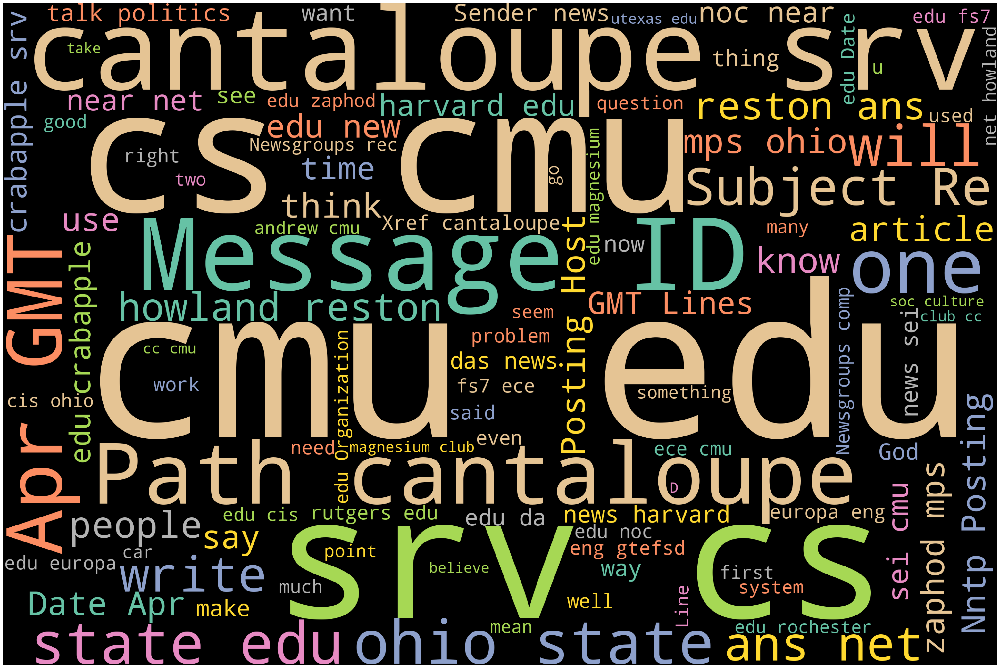

In [53]:
plot_cloud(wordcloud)

In [54]:
wordcloud.to_file("wordcloud.png")

#### Naive bayes

In [55]:
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report

In [56]:
def clean_text(Data):
    text=Data.lower()
    text=re.sub('\[.*?\]','',text)
    text=re.sub(r'[^a-zA-Z\s]','',text)
    text=re.sub('[%s]'% re.escape(string.punctuation),'',text)
    text=re.sub("[0-9" "]+","",text)
    text=re.sub('[''""...]',"",text)
    return text

In [57]:
clean=lambda Data: clean_text(Data)

In [58]:
data['Data']=data.Data.apply(clean)
data.Data

0       path cantaloupesrvcscmuedumagnesiumclubcccmued...
1       newsgroups altatheism\npath cantaloupesrvcscmu...
2       path cantaloupesrvcscmuedudasnewsharvardedunoc...
3       path cantaloupesrvcscmuedumagnesiumclubcccmued...
4       xref cantaloupesrvcscmuedu altatheism talkreli...
                              ...                        
1995    xref cantaloupesrvcscmuedu talkabortion altath...
1996    xref cantaloupesrvcscmuedu talkreligionmisc ta...
1997    xref cantaloupesrvcscmuedu talkorigins talkrel...
1998    xref cantaloupesrvcscmuedu talkreligionmisc al...
1999    xref cantaloupesrvcscmuedu sciskeptic talkpoli...
Name: Data, Length: 2000, dtype: object

In [59]:
data.head()

,Data,Labels
0,path cantaloupesrvcscmuedumagnesiumclubcccmued...,alt.atheism
1,newsgroups altatheism\npath cantaloupesrvcscmu...,alt.atheism
2,path cantaloupesrvcscmuedudasnewsharvardedunoc...,alt.atheism
3,path cantaloupesrvcscmuedumagnesiumclubcccmued...,alt.atheism
4,xref cantaloupesrvcscmuedu altatheism talkreli...,alt.atheism


In [60]:
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\Dayakar Reddy
[nltk_data]     Sura\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Dayakar Reddy
[nltk_data]     Sura\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [61]:
stop=stopwords.words('english')
stop.append("path")
stop.append("xref")
stop.append("newsgroups")
data['Data']=data['Data'].apply(lambda Data:" ".join(Data for Data in Data.split() if Data not in stop))

In [62]:
data.head()

,Data,Labels
0,cantaloupesrvcscmuedumagnesiumclubcccmuedunews...,alt.atheism
1,altatheism cantaloupesrvcscmueducrabapplesrvcs...,alt.atheism
2,cantaloupesrvcscmuedudasnewsharvardedunocnearn...,alt.atheism
3,cantaloupesrvcscmuedumagnesiumclubcccmuedunews...,alt.atheism
4,cantaloupesrvcscmuedu altatheism talkreligionm...,alt.atheism


In [63]:
#Split the Data

In [64]:
train_x,test_x=train_test_split(data,test_size=0.3)

In [65]:
test_x

,Data,Labels
1373,cantaloupesrvcscmuedumagnesiumclubcccmuedunews...,sci.med
371,cantaloupesrvcscmuedurochesterudelbogussuranet...,comp.sys.ibm.pc.hardware
1852,cantaloupesrvcscmuedu misclegal socmen talkpol...,talk.politics.misc
399,cantaloupesrvcscmueducrabapplesrvcscmuedufsece...,comp.sys.ibm.pc.hardware
1671,talkpoliticsgunsorpolitics cantaloupesrvcscmue...,talk.politics.guns
...,...,...
845,cantaloupesrvcscmuedudasnewsharvardedunocnearn...,rec.motorcycles
732,recautos cantaloupesrvcscmuedurochestercornell...,rec.autos
1804,cantaloupesrvcscmuedu talkpoliticsmisc altacti...,talk.politics.misc
1024,cantaloupesrvcscmuedudasnewsharvardedunocnearn...,rec.sport.hockey


In [66]:
bow_data=CountVectorizer(analyzer='word').fit(data.Data)

In [67]:
all_data_matrixs=bow_data.transform(data.Data)
all_data_matrixs.shape

(2000, 45846)

In [68]:
all_data_matrixs

<2000x45846 sparse matrix of type '<class 'numpy.int64'>'
	with 244820 stored elements in Compressed Sparse Row format>

In [69]:
train_data_matrixs=bow_data.transform(train_x.Data)
train_data_matrixs.shape

(1400, 45846)

In [70]:
test_data_matrixs=bow_data.transform(test_x.Data)
test_data_matrixs.shape


(600, 45846)

In [71]:
train_x.Labels

791                    rec.autos
304     comp.sys.ibm.pc.hardware
458        comp.sys.mac.hardware
140                comp.graphics
1656          talk.politics.guns
                  ...           
854              rec.motorcycles
1602          talk.politics.guns
844              rec.motorcycles
1113                   sci.crypt
900           rec.sport.baseball
Name: Labels, Length: 1400, dtype: object

In [72]:
classifier_mb=MultinomialNB()
classifier_mb.fit(train_data_matrixs,train_x.Labels)

MultinomialNB()

In [73]:
train_pred_mb=classifier_mb.predict(train_data_matrixs)
accuracy_train_mb=np.mean(train_pred_mb==train_x.Labels)
print(accuracy_train_mb)

0.9957142857142857


In [74]:
test_pred_mb=classifier_mb.predict(test_data_matrixs)
accuracy_test_mb=np.mean(test_pred_mb==test_x.Labels)
print(accuracy_test_mb)

0.7866666666666666


##### Using Tf-IDF vector

In [75]:
from sklearn.feature_extraction.text import TfidfTransformer

In [76]:
tfidf_trans=TfidfTransformer().fit(all_data_matrixs)

In [77]:
train_tfidf=tfidf_trans.transform(train_data_matrixs)
train_tfidf=train_tfidf.toarray()
train_tfidf.shape

(1400, 45846)

In [78]:
test_tfidf=tfidf_trans.transform(test_data_matrixs)
test_tfidf=test_tfidf.toarray()
test_tfidf.shape

(600, 45846)

In [79]:
classifier_gb=GaussianNB()
classifier_gb.fit(train_tfidf,train_x.Labels)

GaussianNB()

In [80]:
train_pred_gb=classifier_gb.predict(train_tfidf)
accuracy_train_gb=np.mean(train_pred_gb==train_x.Labels)
print(accuracy_train_gb)

1.0


In [81]:
test_pred_gb=classifier_gb.predict(test_tfidf)
accuracy_test_gb=np.mean(test_pred_gb==test_x.Labels)
print(accuracy_test_gb)

0.6516666666666666


#### Sentiment analysis

In [82]:
from nltk import tokenize

In [83]:
data=pd.read_csv("C:/Users/Dayakar Reddy Sura/Downloads/blogs.csv")
data.head()

,Data,Labels
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
1,Newsgroups: alt.atheism\nPath: cantaloupe.srv....,alt.atheism
2,Path: cantaloupe.srv.cs.cmu.edu!das-news.harva...,alt.atheism
3,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,alt.atheism
4,Xref: cantaloupe.srv.cs.cmu.edu alt.atheism:53...,alt.atheism


In [84]:
note=[Data.strip() for Data in data.Data]
note=[Data for Data in note if Data]

In [85]:
def clean_text(Data):
    text=Data.lower()
    text=re.sub('\[.*?\]','',text)
    text=re.sub(r'[^a-zA-Z\s]','',text)
    text=re.sub('[%s]'% re.escape(string.punctuation),'',text)
    text=re.sub("[0-9" "]+","",text)
    text=re.sub('[''""...]',"",text)
    return text

In [86]:
clean=lambda Data: clean_text(Data)

In [87]:
data['Data']=data.Data.apply(clean)
data.Data

0       path cantaloupesrvcscmuedumagnesiumclubcccmued...
1       newsgroups altatheism\npath cantaloupesrvcscmu...
2       path cantaloupesrvcscmuedudasnewsharvardedunoc...
3       path cantaloupesrvcscmuedumagnesiumclubcccmued...
4       xref cantaloupesrvcscmuedu altatheism talkreli...
                              ...                        
1995    xref cantaloupesrvcscmuedu talkabortion altath...
1996    xref cantaloupesrvcscmuedu talkreligionmisc ta...
1997    xref cantaloupesrvcscmuedu talkorigins talkrel...
1998    xref cantaloupesrvcscmuedu talkreligionmisc al...
1999    xref cantaloupesrvcscmuedu sciskeptic talkpoli...
Name: Data, Length: 2000, dtype: object

In [88]:
sentence=tokenize.sent_tokenize(" ".join(note))
sentence[0:15]

["Path: cantaloupe.srv.cs.cmu.edu!magnesium.club.cc.cmu.edu!news.sei.cmu.edu!cis.ohio-state.edu!zaphod.mps.ohio-state.edu!howland.reston.ans.net!agate!doc.ic.ac.uk!uknet!mcsun!Germany.EU.net!thoth.mchp.sni.de!horus.ap.mchp.sni.de!D012S658!frank\nFrom: frank@D012S658.uucp (Frank O'Dwyer)\nNewsgroups: alt.atheism\nSubject: Re: islamic genocide\nDate: 23 Apr 1993 23:51:47 GMT\nOrganization: Siemens-Nixdorf AG\nLines: 110\nDistribution: world\nMessage-ID: <1r9vej$5k5@horus.ap.mchp.sni.de>\nReferences: <1r4o8a$6qe@fido.asd.sgi.com> <1r5ubl$bd6@horus.ap.mchp.sni.de> <1r76ek$7uo@fido.asd.sgi.com>\nNNTP-Posting-Host: d012s658.ap.mchp.sni.de\n\nIn article <1r76ek$7uo@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#In article <1r5ubl$bd6@horus.ap.mchp.sni.de>, frank@D012S658.uucp (Frank O'Dwyer) writes:\n#|> In article <1r4o8a$6qe@fido.asd.sgi.com> livesey@solntze.wpd.sgi.com (Jon Livesey) writes:\n#|> #\n#|> #Noting that a particular society, in this case the mainland UK,\

In [89]:
sent_df=pd.DataFrame(sentence,columns=['sentence'])
sent_df

,sentence
0,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...
1,"#|> \n#|> No, but it allows one to conclude th..."
2,"#\n#""Motivates"" or ""allows?"""
3,The Christian Bible says that one may kill\n#u...
4,"In fact, it instructs one to kill under\n#cert..."
...,...
33919,Any evidence to the contrary ?
33920,"Bill R.\n\n--\n\n""When up a dangerous faction ..."
33921,"To ruin, slaughter, and confound; ..."
33922,"When such a tempest shook the land,\nHow could..."


In [90]:
data.head()

,Data,Labels
0,path cantaloupesrvcscmuedumagnesiumclubcccmued...,alt.atheism
1,newsgroups altatheism\npath cantaloupesrvcscmu...,alt.atheism
2,path cantaloupesrvcscmuedudasnewsharvardedunoc...,alt.atheism
3,path cantaloupesrvcscmuedumagnesiumclubcccmued...,alt.atheism
4,xref cantaloupesrvcscmuedu altatheism talkreli...,alt.atheism


In [91]:
#data.drop(['sentence'],axis=1)

In [92]:
data_score=data.set_index('Data')['Labels'].to_dict()

In [93]:
data_score.get('cantaloupe',0)

0

In [94]:
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=data_score

In [95]:
def calculate_sentiment(text:str=None):
    sent_score_pos=0
    sent_score_neg=0
    sent_score_neutral=0
    if text:
        sentence =nlp(text)
        print(sentence)
        for word in sentence:
            Data=sentiment_lexicon.get(word.lemma_,0)
            if Data>0:
                sent_score_pos+=Data
            elif Data<0:
                sent_score_neg+=Data
            else:
                sent_score_neutral+=Data

    sentiment=sent_score_pos+sent_score_neg+sent_score_neutral
    print("Positive:",sent_score_pos)
    print("Negative:",sent_score_neg)
    print("Neutral:",sent_score_neutral)

    if sentiment >0:
        return "positive"
    elif sentiment < 0:
        return "negative"
    else:
        return "neutral"
        

In [96]:
calculate_sentiment(text="dayakar is a good boy")

dayakar is a good boy
Positive: 0
Negative: 0
Neutral: 0


'neutral'

In [97]:
#data['sentiment_value']=data['Data'].apply(calculate_sentiment)
#data.head()

In [102]:
#data[data.sentiment_value=="neutral"]

In [103]:
#data.sort_values(by='sentiment_value').head()

In [104]:
#data.sort_values(by='word_count').tail()

In [ ]:
#data['sentiment_value'].describe()

In [ ]:
#data[data['sentiment_value']>0].head()

In [ ]:
#data[data['sentiment_value']< -5].head()['sentence'].tolist()[0]

In [105]:
data['index']=range(0,len(data))

In [107]:
#sns.set_style(style='white')
#sns.displot(data=data,x='sentiment_value',kde=True)
#plt.show()

In [109]:
#plt.figure(figsize=(15,10))
#sns.lineplot(y='sentiment_value',x=range(len(data)),data=data)

In [110]:
#data.plot.scatter(x='word_count',y='sentiment_value',figsize=(8,8),title='sentence sentiment value to sentence word count')

In [111]:
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download("vader_lexicon")

[nltk_data] Downloading package vader_lexicon to C:\Users\Dayakar
[nltk_data]     Reddy Sura\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [112]:
def analyze_emotion(Data):
    sia=SentimentIntensityAnalyzer()
    sentiment_score=sia.polarity_scores(Data)
    if sentiment_score['compound']>=0.05:
        sentiment="Positive"
    elif sentiment_score['compound']<=-0.05:
        sentiment="Negative"
    else:
        sentiment="Neutral"
    return sentiment,sentiment_score

In [113]:
example_text="I love Datascience ,it is such as a powerfull and versatile analysis"

In [114]:
result,scores=analyze_emotion(example_text)

In [115]:
print(f'Text:{example_text}')
print(f'sentiment:{result}')
print(f'sentiment score:{scores}')

Text:I love Datascience ,it is such as a powerfull and versatile analysis
sentiment:Positive
sentiment score:{'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}


In [116]:
!pip install NRCLex

INFO: pip is looking at multiple versions of nrclex to determine which version is compatible with other requirements. This could take a while.
     ---------------------------------------- 0.0/396.4 kB ? eta -:--:--
     ------------------------------------  389.1/396.4 kB 11.8 MB/s eta 0:00:01
     -------------------------------------- 396.4/396.4 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/626.3 kB ? eta -:--:--
   --------------------------------------- 626.3/626.3 kB 38.5 MB/s eta 0:00:00
  Created wheel for NRCLex: filename=NRCLex-3.0.0-py3-none-any.whl size=43342 sha256=306410d74086fb64a81499abe6b178126423e35129e420a2239b93255fe4ddea
  Stored in directory: c:\users\dayakar reddy sura\appdata\local\pip\cache\wheels\ed\ac\fa\7afddefd14f51c4a963ed291b9052746ed3929473e5a33118d
Successfully built NRCLex


In [117]:
from nrclex import NRCLex

In [118]:
text=" ".join(data.Data)
text

'path cantaloupesrvcscmuedumagnesiumclubcccmuedunewsseicmueducisohiostateeduzaphodmpsohiostateeduhowlandrestonansnetagatedocicacukuknetmcsungermanyeunetthothmchpsnidehorusapmchpsnidedsfrank\nfrom frankdsuucp frank odwyer\nnewsgroups altatheism\nsubject re islamic genocide\ndate  apr   gmt\norganization siemensnixdorf ag\nlines \ndistribution world\nmessageid rvejkhorusapmchpsnide\nreferences roaqefidoasdsgicom rublbdhorusapmchpsnide rekuofidoasdsgicom\nnntppostinghost dsapmchpsnide\n\nin article rekuofidoasdsgicom liveseysolntzewpdsgicom jon livesey writes\nin article rublbdhorusapmchpsnide frankdsuucp frank odwyer writes\n in article roaqefidoasdsgicom liveseysolntzewpdsgicom jon livesey writes\n \n noting that a particular society in this case the mainland uk\n has few religously motivated murders and few murders of any\n kind says very little about whether interreligion murders elsewhere\n are religiously motivated\n \n no but it allows one to conclude that there is nothing inherent

In [120]:
sentiment=NRCLex(text)
sentiment.affect_frequencies

{'fear': 0.1004690400964138,
 'anger': 0.05742483958177258,
 'anticip': 0.0,
 'trust': 0.15275561056643105,
 'surprise': 0.05108954105729455,
 'positive': 0.2163040291847171,
 'negative': 0.14500342008403636,
 'sadness': 0.058345005048695484,
 'disgust': 0.03716491319500993,
 'joy': 0.07222891762483306,
 'anticipation': 0.10921468356079607}